In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

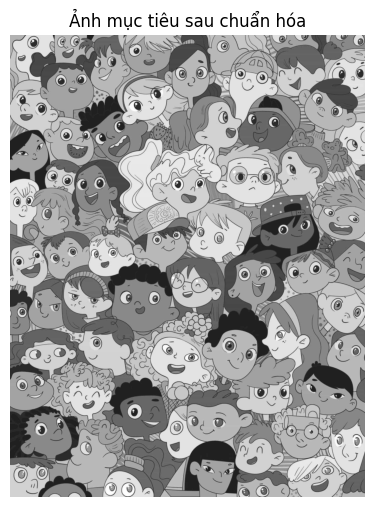

(1829, 1405)


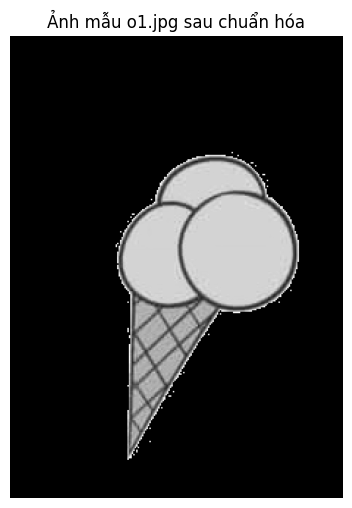

(315, 227)


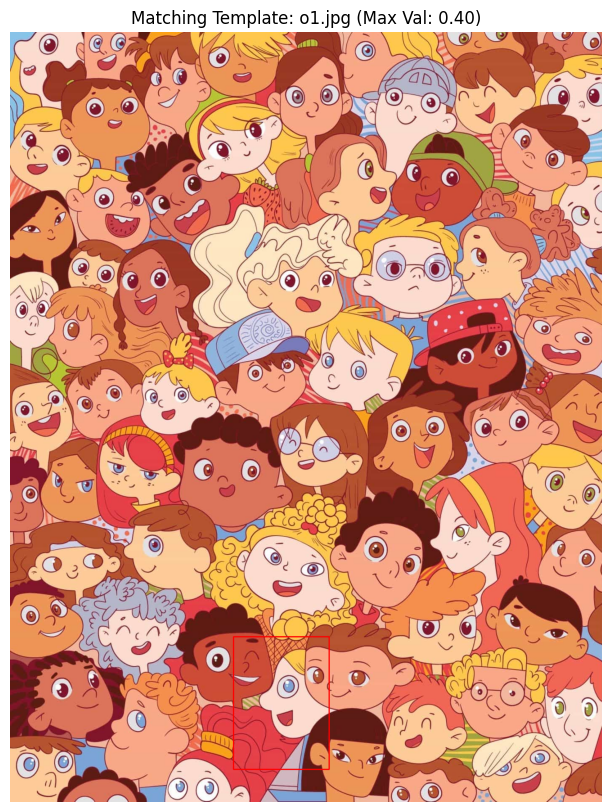

(1829, 1405, 3)


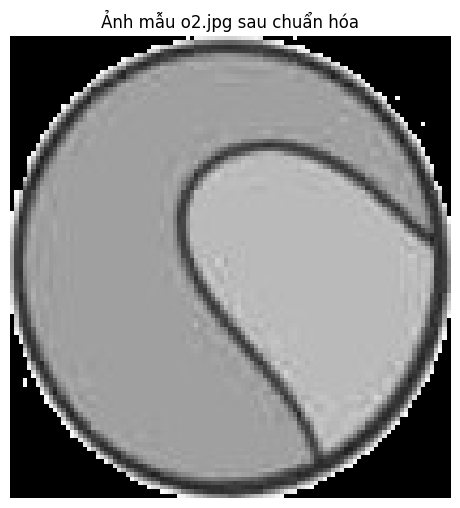

(108, 103)


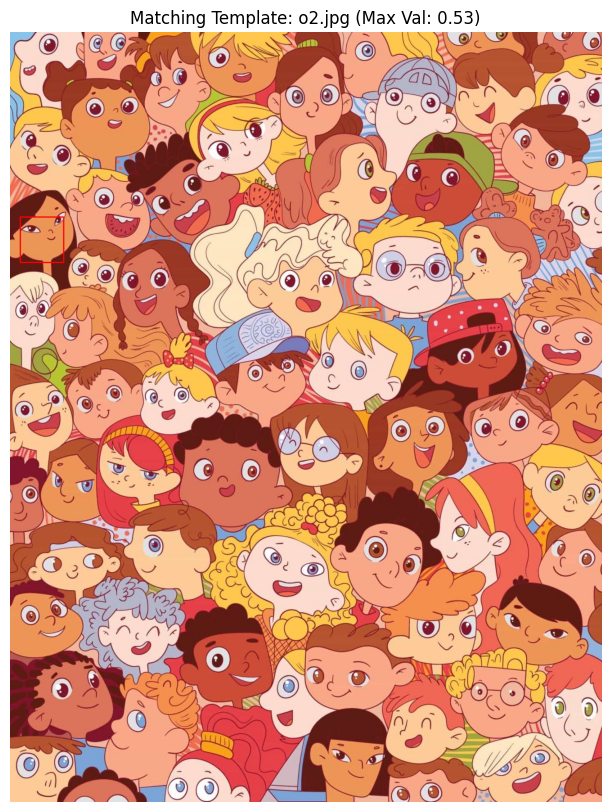

(1829, 1405, 3)


In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def normalize_image(image_gray):
    """Chuẩn hóa ảnh bằng cách trừ đi mức xám trung bình"""
    mean = np.mean(image_gray)  # Tính mức xám trung bình
    normalized_image = image_gray - mean  # Trừ đi mức xám trung bình
    return normalized_image.astype(np.float32)  # Chuyển về float32

def process_template_image(template_gray):
    """Chuyển tất cả các điểm ảnh có màu trắng (255) ngoài viền đồ vật về màu đen (0)"""
    # Tìm viền của đồ vật
    edges = cv2.Canny(template_gray, 100, 200)

    # Tạo mask cho viền
    mask = np.zeros_like(template_gray)
    mask[edges > 0] = 255  # Gán giá trị 255 cho vùng viền

    # Chuyển nền trắng thành đen nhưng giữ viền trắng
    template_gray[(template_gray >= 240) & (mask == 0)] = 0

    return template_gray

def match_templates_in_directory(directory, target_image_name, threshold=0.3):
    # Đọc ảnh mục tiêu
    target_image_path = os.path.join(directory, target_image_name)
    target_image = cv2.imread(target_image_path)
    if target_image is None:
        print(f"Không thể đọc ảnh mục tiêu: {target_image_name}")
        return
    
    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    target_gray = normalize_image(target_gray)  # Chuẩn hóa ảnh mục tiêu

    # Hiển thị ảnh mục tiêu sau chuẩn hóa
    plt.figure(figsize=(6, 6))
    plt.imshow(target_gray, cmap='gray')
    plt.title("Ảnh mục tiêu sau chuẩn hóa")
    plt.axis('off')
    plt.show()
    print(target_gray.shape)
    
    # Lặp qua các file trong thư mục để tìm các mẫu
    for filename in os.listdir(directory):
        if filename == target_image_name:
            continue  # Bỏ qua ảnh mục tiêu

        # Đọc mẫu
        template_image_path = os.path.join(directory, filename)
        template_image = cv2.imread(template_image_path)
        if template_image is None:
            continue  # Bỏ qua nếu không thể đọc ảnh
        
        template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
        template_gray = process_template_image(template_gray)  # Xử lý ảnh mẫu
        template_gray = normalize_image(template_gray)  # Chuẩn hóa ảnh mẫu

        # Hiển thị ảnh mẫu sau chuẩn hóa
        plt.figure(figsize=(6, 6))
        plt.imshow(template_gray, cmap='gray')
        plt.title(f"Ảnh mẫu {filename} sau chuẩn hóa")
        plt.axis('off')
        plt.show()
        print(template_gray.shape)

        # Template matching
        result = cv2.matchTemplate(target_gray, template_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

        # Kiểm tra ngưỡng so khớp
        if max_val >= threshold:
            # Vẽ hình chữ nhật quanh vị trí phát hiện được mẫu
            w, h = template_gray.shape[::-1]
            top_left = max_loc
            bottom_right = (top_left[0] + w, top_left[1] + h)
            
            # Tạo bản sao của ảnh mục tiêu để vẽ lên
            image_copy = target_image.copy()
            cv2.rectangle(image_copy, top_left, bottom_right, (0, 0, 255), 2)

            # Hiển thị kết quả ảnh với mẫu khớp
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))
            plt.title(f'Matching Template: {filename} (Max Val: {max_val:.2f})')
            plt.axis('off')
            plt.show()
            print(image_copy.shape)
        else:
            print(f'Mẫu {filename} không đạt ngưỡng: {max_val:.2f}')

# Gọi hàm với đường dẫn thư mục chứa ảnh và tên của ảnh mục tiêu
match_templates_in_directory("C:/Users/ADMIN/Videos", "1.jpg")


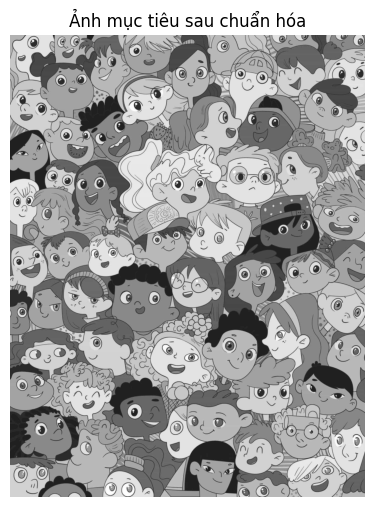

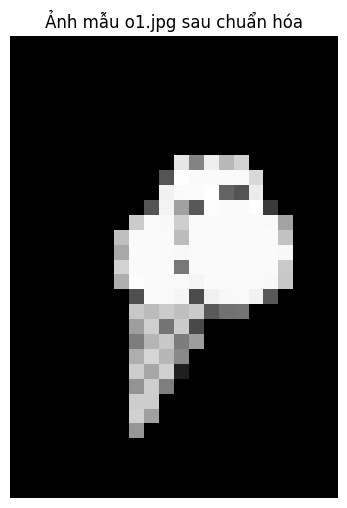

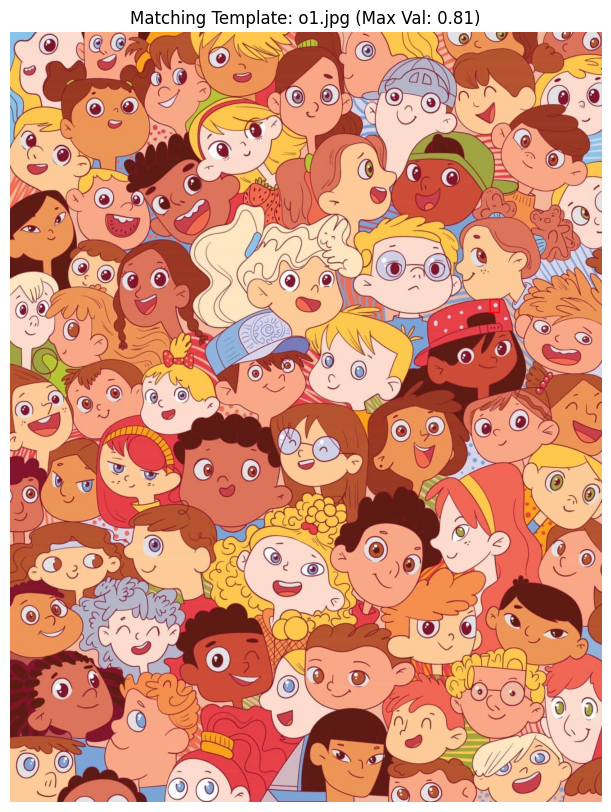

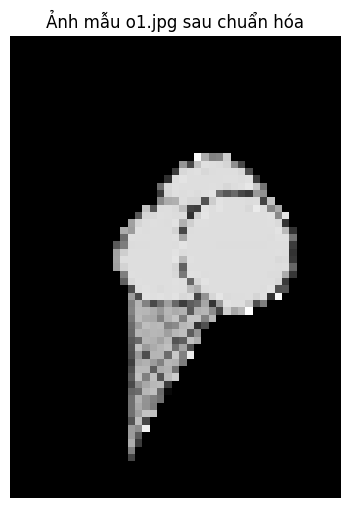

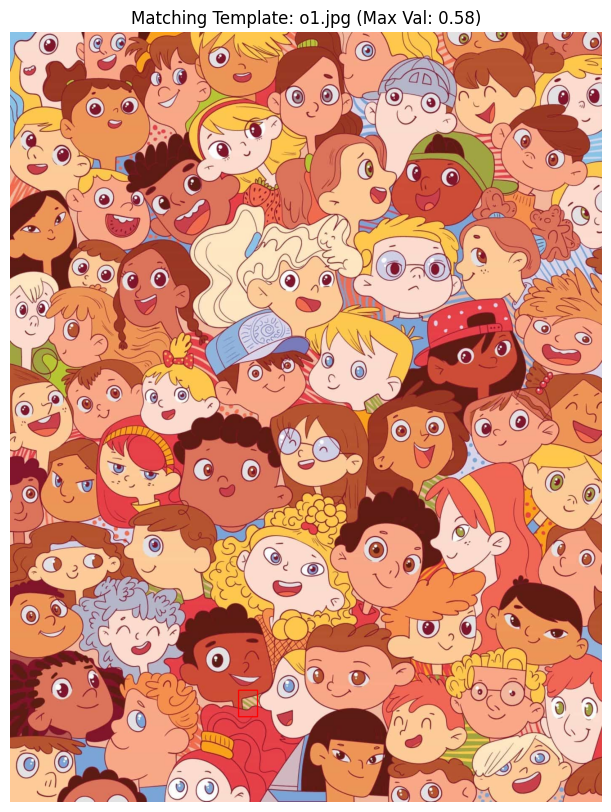

...

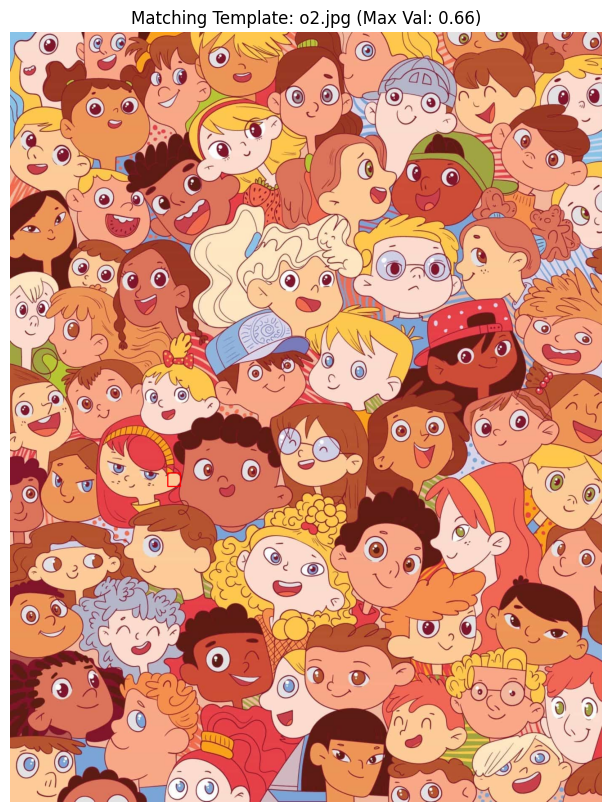

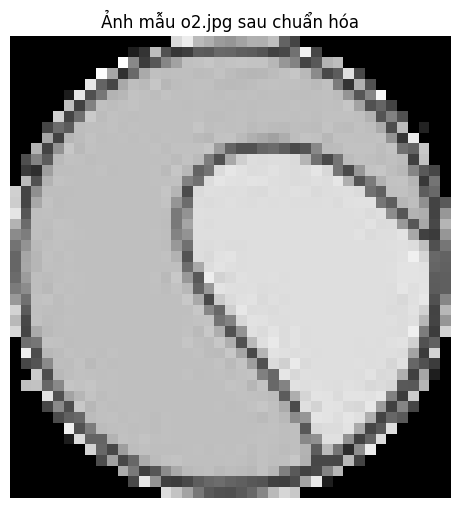

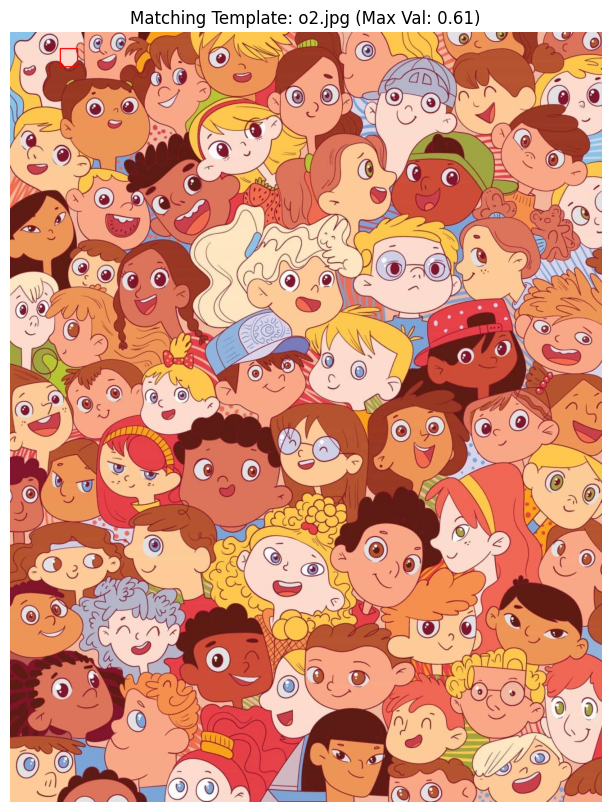

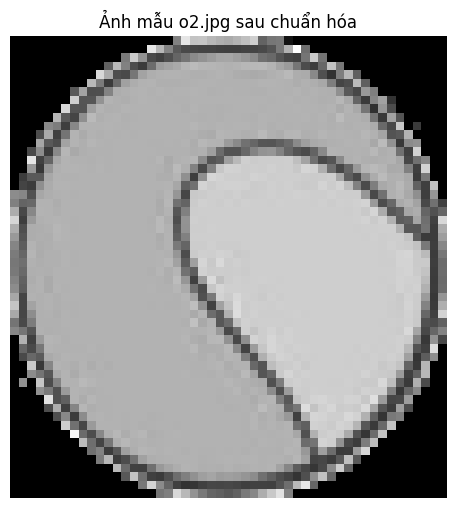

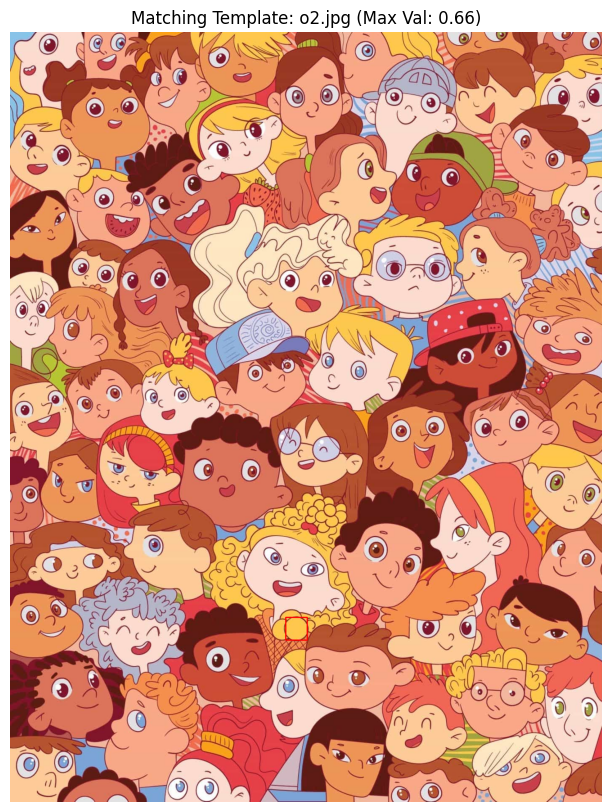

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def normalize_image(image_gray):
    mean = np.mean(image_gray)
    normalized_image = image_gray - mean
    return normalized_image.astype(np.float32)

def process_template_image(template_gray):
    edges = cv2.Canny(template_gray, 100, 200)
    mask = np.zeros_like(template_gray)
    mask[edges > 0] = 255
    template_gray[(template_gray >= 240) & (mask == 0)] = 0
    return template_gray

def resize_template(template, scales):
    resized_templates = []
    for scale in scales:
        width = int(template.shape[1] * scale)
        height = int(template.shape[0] * scale)
        resized_template = cv2.resize(template, (width, height))
        resized_templates.append(resized_template)
    return resized_templates

def match_templates_in_directory(directory, target_image_name, threshold=0.3, scales=[0.1,0.2,0.3,0.4,0.5]):
    target_image_path = os.path.join(directory, target_image_name)
    target_image = cv2.imread(target_image_path)
    if target_image is None:
        print(f"Không thể đọc ảnh mục tiêu: {target_image_name}")
        return
    
    target_gray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    target_gray = normalize_image(target_gray)

    plt.figure(figsize=(6, 6))
    plt.imshow(target_gray, cmap='gray')
    plt.title("Ảnh mục tiêu sau chuẩn hóa")
    plt.axis('off')
    plt.show()
    
    for filename in os.listdir(directory):
        if filename == target_image_name:
            continue  

        template_image_path = os.path.join(directory, filename)
        template_image = cv2.imread(template_image_path)
        if template_image is None:
            continue 
        
        template_gray = cv2.cvtColor(template_image, cv2.COLOR_BGR2GRAY)
        template_gray = process_template_image(template_gray)
        template_gray = normalize_image(template_gray)

        resized_templates = resize_template(template_gray, scales)  # Resize mẫu
        for resized_template in resized_templates:
            plt.figure(figsize=(6, 6))
            plt.imshow(resized_template, cmap='gray')
            plt.title(f"Ảnh mẫu {filename} sau chuẩn hóa")
            plt.axis('off')
            plt.show()

            result = cv2.matchTemplate(target_gray, resized_template, cv2.TM_CCOEFF_NORMED)
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

            if max_val >= threshold:
                w, h = resized_template.shape[::-1]
                top_left = max_loc
                bottom_right = (top_left[0] + w, top_left[1] + h)
                
                image_copy = target_image.copy()
                cv2.rectangle(image_copy, top_left, bottom_right, (0, 0, 255), 2)

                plt.figure(figsize=(10, 10))
                plt.imshow(cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB))
                plt.title(f'Matching Template: {filename} (Max Val: {max_val:.2f})')
                plt.axis('off')
                plt.show()
            else:
                print(f'Mẫu {filename} không đạt ngưỡng: {max_val:.2f}')

# Gọi hàm với đường dẫn thư mục chứa ảnh và tên của ảnh mục tiêu
match_templates_in_directory("C:/Users/ADMIN/Videos", "1.jpg")
